In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from decimal import Decimal

Duration/Emission
Framerate/?
Add fps column

In [2]:
benchmark_result_path: str = 'benchmark_results/encoding_results_2023-09-27_06-41-42.csv'
figures_path: str = 'figures'
include_title: bool = False

DPI: int = 450
FONT_SIZE: int = 40
FIG_SIZE: tuple[int, int] = (12, 9)

In [3]:
sns.set(font_scale=1.5)

In [4]:
df_pd = pd.read_csv(benchmark_result_path, index_col=0)
df_pd.head()

,timestamp,project_name,run_id,duration,emissions,emissions_rate,cpu_power,gpu_power,ram_power,cpu_energy,...,timestamp.1,last_timestamp,preset,codec,duration.1,bitrate,width,height,video_name,output_path
0,2023-09-25T11:47:07,codecarbon,bbf02b9d-4f6d-4005-9712-13d8e7f77558,6.271335,0.000106,0.000017,188.007523,19.912,377.875335,0.000381,...,1.695635e+09,1.695635e+09,medium,h264,4,145,416,234,AncientThought_s000.265,h264/AncientThought_s000.265/4s/medium/145k_41...
1,2023-09-25T11:47:14,codecarbon,fff0ec94-3061-4763-b234-91101f9960e1,6.246839,0.000096,0.000015,176.711203,19.471,377.875335,0.000376,...,1.695635e+09,1.695635e+09,medium,h264,4,145,416,234,AncientThought_s000.265,h264/AncientThought_s000.265/4s/medium/145k_41...
2,2023-09-25T11:47:22,codecarbon,a456832d-2423-47b0-b2df-f22b830cc531,6.247526,0.000096,0.000015,179.754596,19.181,377.875335,0.000377,...,1.695635e+09,1.695635e+09,medium,h264,4,145,416,234,AncientThought_s000.265,h264/AncientThought_s000.265/4s/medium/145k_41...
3,2023-09-25T11:47:29,codecarbon,1013f309-f39a-4a78-9791-aefac6af86f9,6.266295,0.000097,0.000015,190.520159,19.363,377.875335,0.000378,...,1.695635e+09,1.695635e+09,medium,h264,4,365,640,360,AncientThought_s000.265,h264/AncientThought_s000.265/4s/medium/365k_64...
4,2023-09-25T11:47:37,codecarbon,7495cf96-2b18-47be-931c-7ea89ed1c899,6.349838,0.000099,0.000016,168.388725,19.324,377.875335,0.000394,...,1.695635e+09,1.695635e+09,medium,h264,4,365,640,360,AncientThought_s000.265,h264/AncientThought_s000.265/4s/medium/365k_64...


In [5]:
df_pd['fps'] = df_pd['output_path'].apply(lambda x: x.split('/')[-1]) 
df_pd['fps'] = df_pd['fps'].apply(lambda x: x.removesuffix('fps')).astype('int')

In [6]:
# df_pd['fps']

In [7]:
duplicates = [x for x in df_pd.columns if x.endswith('.1')]
df_pd = df_pd.drop(columns=duplicates)

In [8]:
df_pd = df_pd.iloc[0:len(df_pd)-3]

In [9]:
# df_pd.head()

In [10]:
# for x in df_pd.columns:
#     print(x)
df_pd['Codec'] = df_pd['codec']

In [11]:
df_pd['Codec'] = df_pd['Codec'].map({
    'h264': 'AVC',
    'h265': 'HEVC',
})

In [12]:
sns.set(style='whitegrid')


/var/folders/k8/rwvwc5ns3d16t55m5svq75wh0000gn/T/ipykernel_78459/2351367496.py:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  line_plot.set_xticklabels([int(x) for x in line_plot.get_xticks()], size=FONT_SIZE, rotation=45)
/var/folders/k8/rwvwc5ns3d16t55m5svq75wh0000gn/T/ipykernel_78459/2351367496.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  line_plot.set_yticklabels([int(y) for y in line_plot.get_yticks()], size=FONT_SIZE)


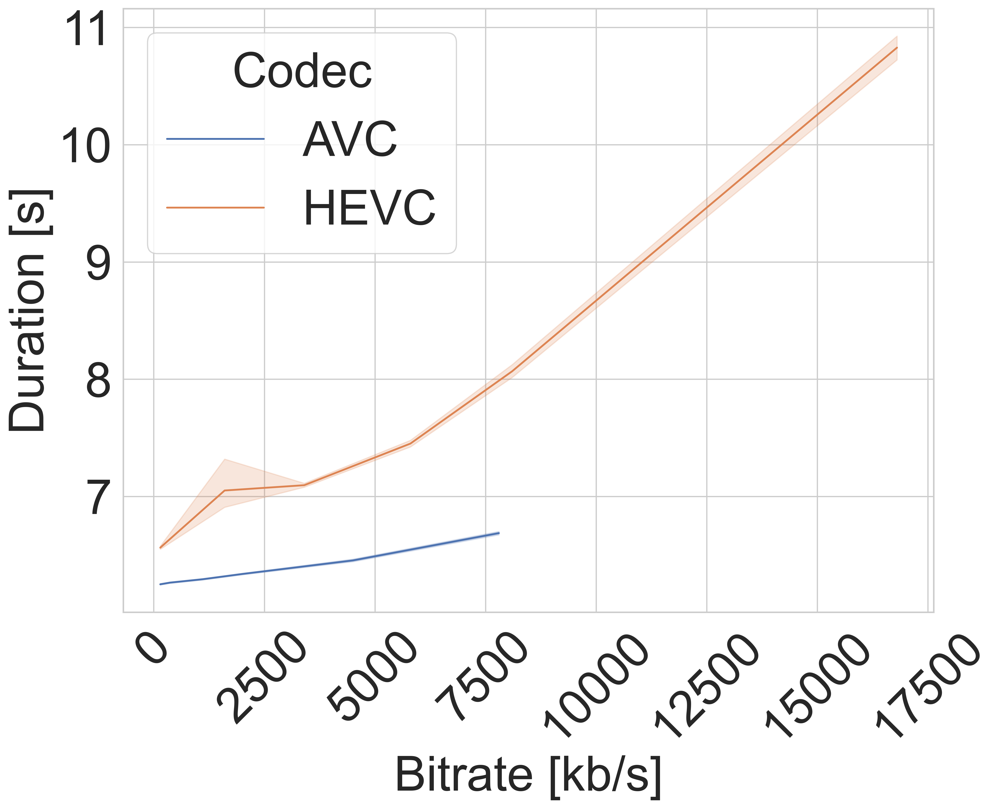

In [13]:

plt.figure(figsize=FIG_SIZE, dpi=DPI)
df_x_val = 'bitrate'
df_y_val = 'duration'
hue = 'Codec'
line_plot = sns.lineplot(df_pd, x=df_x_val, y=df_y_val, hue=hue)
line_plot.legend(fontsize=FONT_SIZE, title_fontsize=FONT_SIZE, title=hue)
line_plot.set_xlabel('Bitrate [kb/s]', fontsize=FONT_SIZE)
line_plot.set_ylabel('Duration [s]', fontsize=FONT_SIZE)
line_plot.set_xticklabels([int(x) for x in line_plot.get_xticks()], size=FONT_SIZE, rotation=45)
line_plot.set_yticklabels([int(y) for y in line_plot.get_yticks()], size=FONT_SIZE)
if include_title:
    plt.title('Duration per Bitrate')
plt.savefig(f'{figures_path}/duration_per_br.pdf')

/var/folders/k8/rwvwc5ns3d16t55m5svq75wh0000gn/T/ipykernel_78459/1317600693.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  line_plot.set_xticklabels([int(x) for x in line_plot.get_xticks()], size=FONT_SIZE, rotation=45)
/var/folders/k8/rwvwc5ns3d16t55m5svq75wh0000gn/T/ipykernel_78459/1317600693.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  line_plot.set_yticklabels(['{:.1E}'.format(Decimal(y)) for y in line_plot.get_yticks()], size=FONT_SIZE, rotation=45)


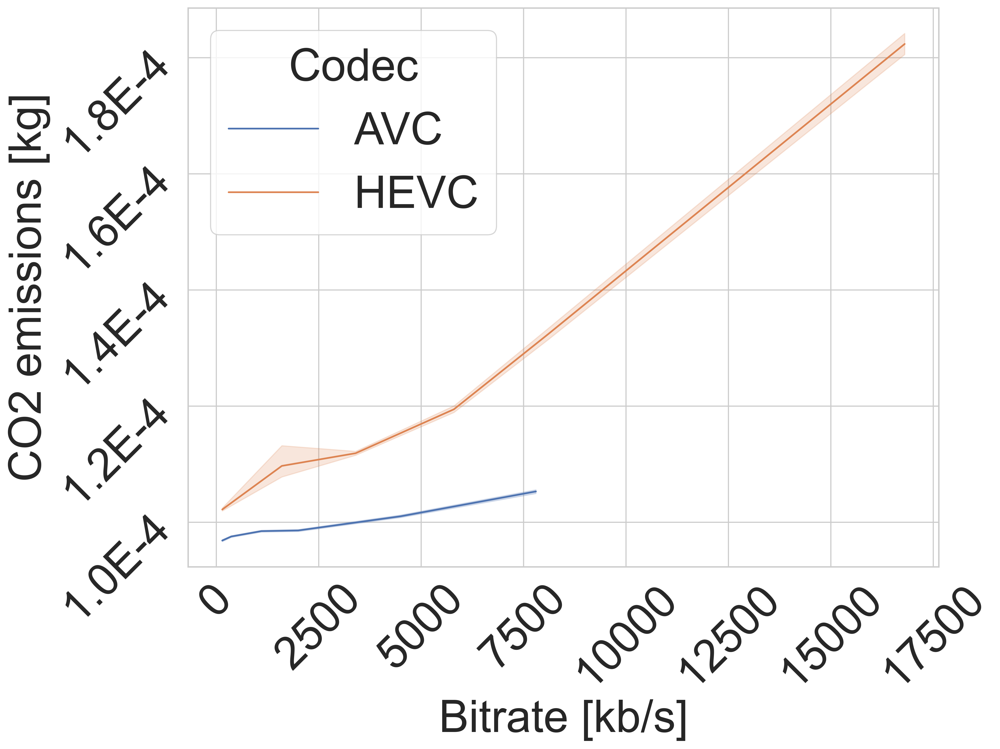

In [14]:
plt.figure(figsize=FIG_SIZE, dpi=DPI)
df_x_val = 'bitrate'
df_y_val = 'emissions'
hue = 'Codec'
line_plot = sns.lineplot(df_pd, x=df_x_val, y=df_y_val, hue=hue)
line_plot.legend(fontsize=FONT_SIZE, title_fontsize=FONT_SIZE, title=hue)
# line_plot = sns.lineplot(df_pd, x='bitrate', y='emissions', hue='Codec')
line_plot.set_xlabel('Bitrate [kb/s]', fontsize=FONT_SIZE)
line_plot.set_ylabel('CO2 emissions [kg]', fontsize=FONT_SIZE)
line_plot.set_xticklabels([int(x) for x in line_plot.get_xticks()], size=FONT_SIZE, rotation=45)
line_plot.set_yticklabels(['{:.1E}'.format(Decimal(y)) for y in line_plot.get_yticks()], size=FONT_SIZE, rotation=45)
if include_title:
    plt.title('CO2 [kg] emissions per Bitrate')
plt.savefig(f'{figures_path}/co2_per_br.pdf')

/var/folders/k8/rwvwc5ns3d16t55m5svq75wh0000gn/T/ipykernel_78459/3466783574.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  line_plot.set_xticklabels([int(x) for x in line_plot.get_xticks()], size=FONT_SIZE, rotation=45)
/var/folders/k8/rwvwc5ns3d16t55m5svq75wh0000gn/T/ipykernel_78459/3466783574.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  line_plot.set_yticklabels(['{:.1E}'.format(Decimal(y)) for y in line_plot.get_yticks()], size=FONT_SIZE, rotation=45)


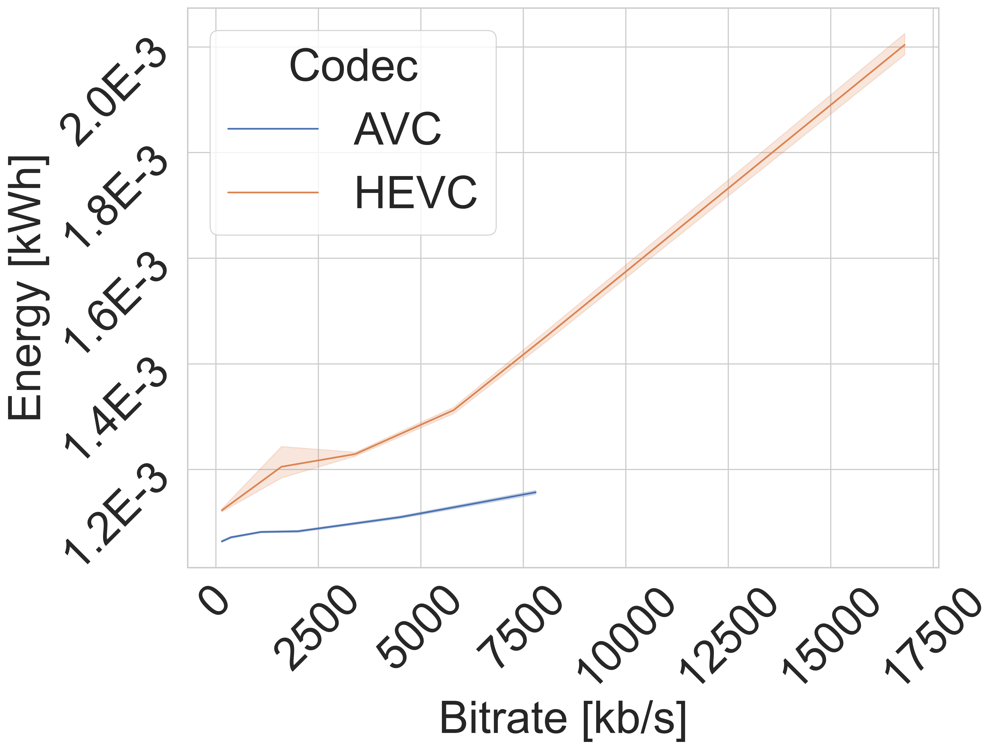

In [15]:
plt.figure(figsize=FIG_SIZE, dpi=DPI)
df_x_val = 'bitrate'
df_y_val = 'energy_consumed'
hue = 'Codec'
line_plot = sns.lineplot(df_pd, x=df_x_val, y=df_y_val, hue=hue)
line_plot.legend(fontsize=FONT_SIZE, title_fontsize=FONT_SIZE, title=hue)
# line_plot = sns.lineplot(df_pd, x='bitrate', y='energy_consumed', hue='Codec')
line_plot.set_xlabel('Bitrate [kb/s]', fontsize=FONT_SIZE)
line_plot.set_ylabel('Energy [kWh]', fontsize=FONT_SIZE)
line_plot.set_xticklabels([int(x) for x in line_plot.get_xticks()], size=FONT_SIZE, rotation=45)
line_plot.set_yticklabels(['{:.1E}'.format(Decimal(y)) for y in line_plot.get_yticks()], size=FONT_SIZE, rotation=45)
if include_title:
    plt.title('Energy Consumption (kWh) per Bitrate')
plt.savefig(f'{figures_path}/energy_per_br.pdf')

/var/folders/k8/rwvwc5ns3d16t55m5svq75wh0000gn/T/ipykernel_78459/2400476329.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  line_plot.set_xticklabels([int(x) for x in line_plot.get_xticks()], size=FONT_SIZE, rotation=45)
/var/folders/k8/rwvwc5ns3d16t55m5svq75wh0000gn/T/ipykernel_78459/2400476329.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  line_plot.set_yticklabels([int(y) for y in line_plot.get_yticks()], size=FONT_SIZE)


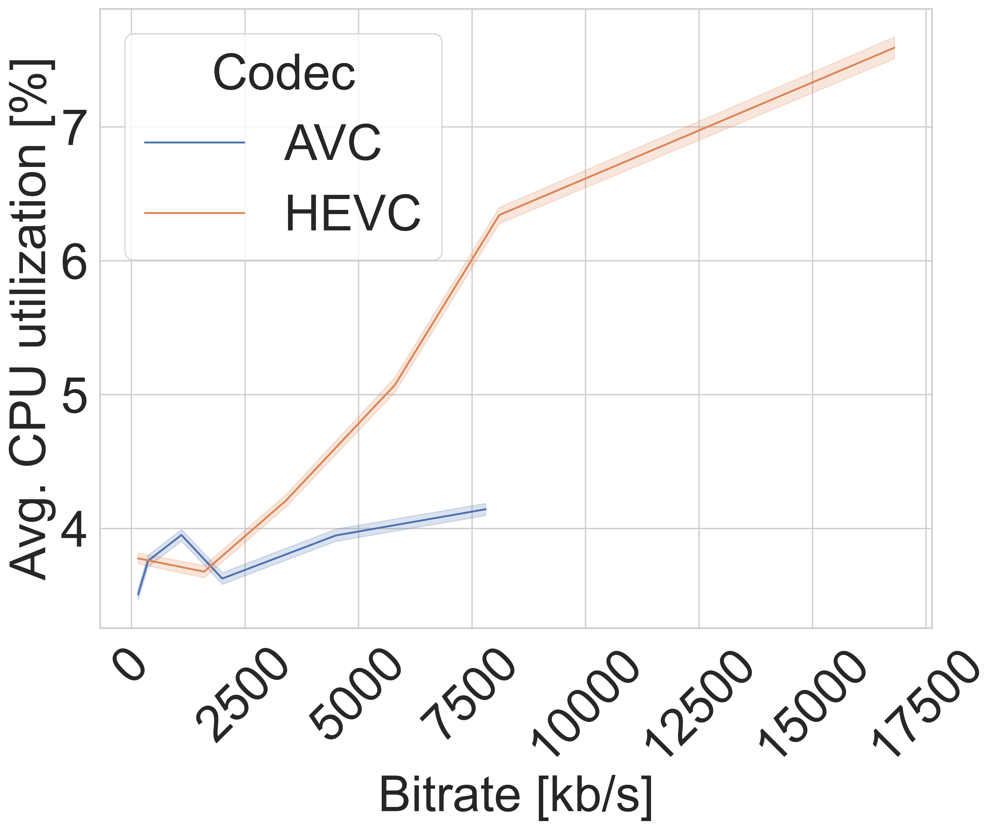

In [16]:
plt.figure(figsize=FIG_SIZE, dpi=DPI)
df_x_val = 'bitrate'
df_y_val = 'host.cpu_percent.mean'
hue = 'Codec'
line_plot = sns.lineplot(df_pd, x=df_x_val, y=df_y_val, hue=hue)
line_plot.legend(fontsize=FONT_SIZE, title_fontsize=FONT_SIZE, title=hue)
# line_plot = sns.lineplot(df_pd, x='bitrate', y='host.cpu_percent.mean', hue='Codec')
line_plot.set_xlabel('Bitrate [kb/s]', fontsize=FONT_SIZE)
line_plot.set_ylabel('Avg. CPU utilization [%]', fontsize=FONT_SIZE)
line_plot.set_xticklabels([int(x) for x in line_plot.get_xticks()], size=FONT_SIZE, rotation=45)
line_plot.set_yticklabels([int(y) for y in line_plot.get_yticks()], size=FONT_SIZE)
if include_title:
    plt.title('Average CPU Utilization per Bitrate')
plt.savefig(f'{figures_path}/avg_cpu_per_br.pdf')

/var/folders/k8/rwvwc5ns3d16t55m5svq75wh0000gn/T/ipykernel_78459/1582554865.py:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  line_plot.set_xticklabels([int(x) for x in line_plot.get_xticks()], size=FONT_SIZE, rotation=45)
/var/folders/k8/rwvwc5ns3d16t55m5svq75wh0000gn/T/ipykernel_78459/1582554865.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  line_plot.set_yticklabels([round(y, 2) for y in line_plot.get_yticks()], size=FONT_SIZE)


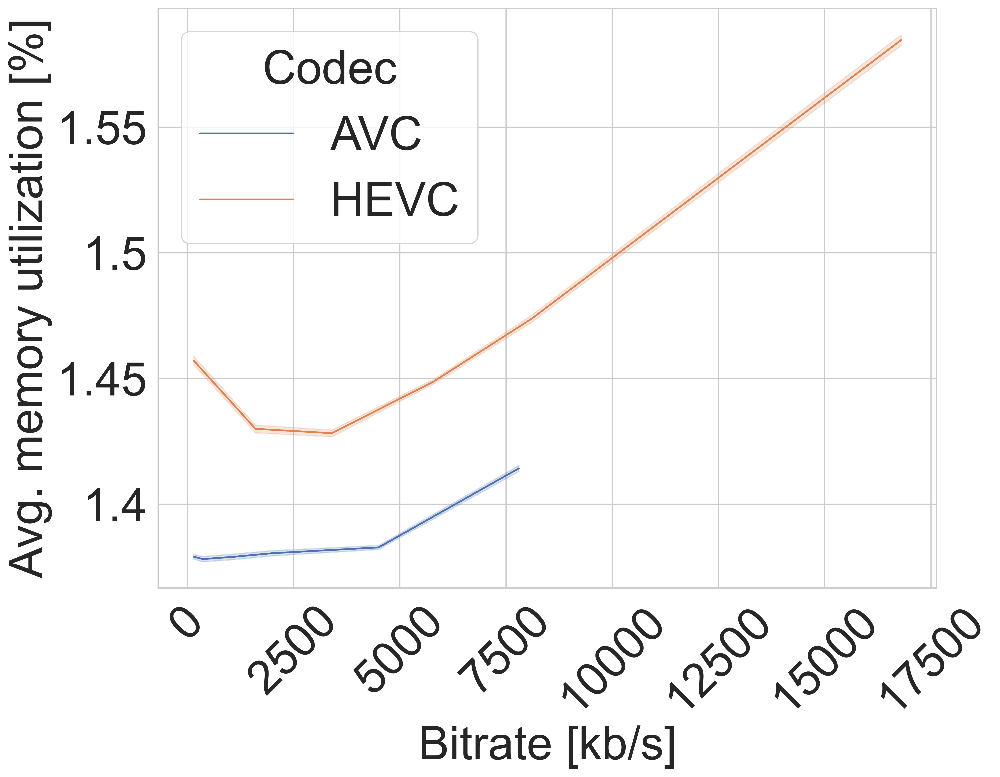

In [17]:
plt.figure(figsize=FIG_SIZE, dpi=DPI)
df_x_val = 'bitrate'
df_y_val = 'host.memory_percent.mean'
hue = 'Codec'
line_plot = sns.lineplot(df_pd, x=df_x_val, y=df_y_val, hue=hue)
line_plot.legend(fontsize=FONT_SIZE, title_fontsize=FONT_SIZE, title=hue)
line_plot.set_xlabel('Bitrate [kb/s]', fontsize=FONT_SIZE)
line_plot.set_ylabel('Avg. memory utilization [%]', fontsize=FONT_SIZE)
line_plot.set_xticklabels([int(x) for x in line_plot.get_xticks()], size=FONT_SIZE, rotation=45)
line_plot.set_yticklabels([round(y, 2) for y in line_plot.get_yticks()], size=FONT_SIZE)
if include_title:
    plt.title('Average Memory Utilization per Bitrate')
plt.savefig(f'{figures_path}/avg_mem_per_br.pdf')

In [18]:
for col in df_pd.columns[:30]:
    print(col)

timestamp
project_name
run_id
duration
emissions
emissions_rate
cpu_power
gpu_power
ram_power
cpu_energy
gpu_energy
ram_energy
energy_consumed
country_name
country_iso_code
region
cloud_provider
cloud_region
os
python_version
codecarbon_version
cpu_count
cpu_model
gpu_count
gpu_model
longitude
latitude
ram_total_size
tracking_mode
on_cloud


/var/folders/k8/rwvwc5ns3d16t55m5svq75wh0000gn/T/ipykernel_78459/1840025418.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  line_plot.set_yticklabels(['{:.1E}'.format(Decimal(y)) for y in line_plot.get_yticks()], size=FONT_SIZE, rotation=45)


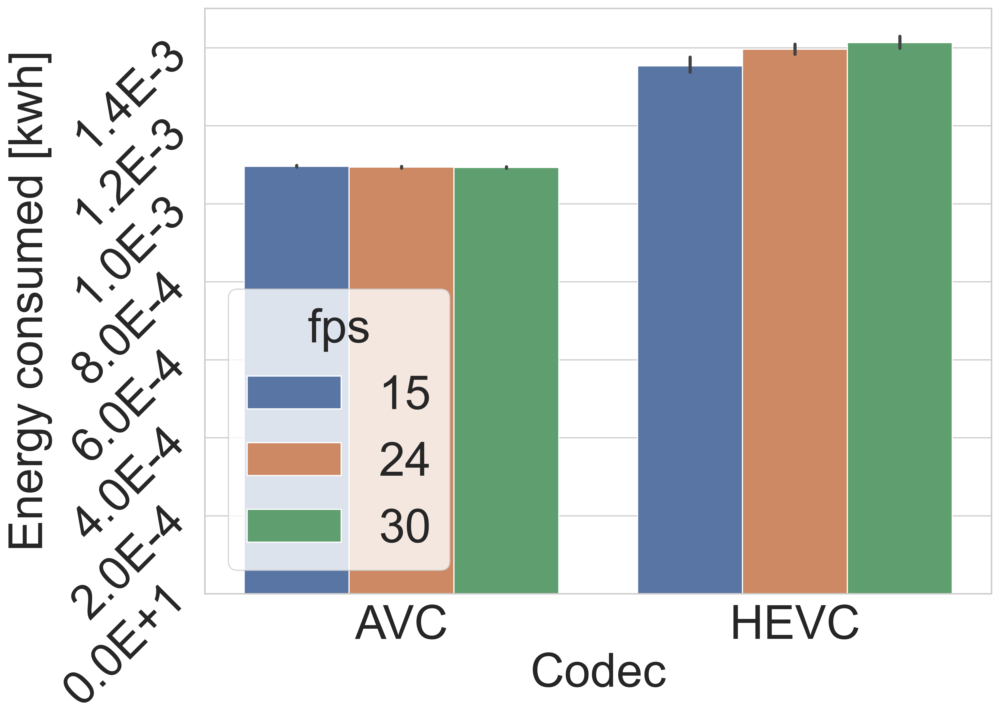

In [19]:
plt.figure(figsize=FIG_SIZE, dpi=DPI)
df_x_val = 'codec'
df_y_val = 'energy_consumed'
hue = 'fps'
line_plot = sns.barplot(df_pd, x=df_x_val, y=df_y_val, hue=hue)
line_plot.legend(fontsize=FONT_SIZE, title_fontsize=FONT_SIZE, title=hue)
line_plot.set_xlabel('Codec', fontsize=FONT_SIZE)
line_plot.set_ylabel('Energy consumed [kwh]', fontsize=FONT_SIZE)
line_plot.set_xticklabels(['AVC', 'HEVC'], size=FONT_SIZE)
line_plot.set_yticklabels(['{:.1E}'.format(Decimal(y)) for y in line_plot.get_yticks()], size=FONT_SIZE, rotation=45)
if include_title:
    plt.title('Average Memory Utilization per Bitrate')
plt.savefig(f'{figures_path}/avg_mem_per_br.pdf')

In [20]:
# df_pd[df_pd['fps'] < df_pd['fps'].quantile(.95)]
df_pd[df_pd['Codec'] == 'HEVC']

,timestamp,project_name,run_id,duration,emissions,emissions_rate,cpu_power,gpu_power,ram_power,cpu_energy,...,last_timestamp,preset,codec,bitrate,width,height,video_name,output_path,fps,Codec
9000,2023-09-26T07:11:00,codecarbon,b89a7e2d-1ba8-4443-9beb-b5acf875f409,6.490701,0.000100,0.000015,195.517735,19.507,377.875335,0.000398,...,1.695705e+09,medium,h265,145,640,360,AncientThought_s000.265,h265/AncientThought_s000.265/4s/medium/145k_64...,15,HEVC
9001,2023-09-26T07:11:08,codecarbon,02038675-c63e-4c32-86f5-022da3688989,6.447687,0.000099,0.000015,197.450491,19.680,377.875335,0.000393,...,1.695705e+09,medium,h265,145,640,360,AncientThought_s000.265,h265/AncientThought_s000.265/4s/medium/145k_64...,24,HEVC
9002,2023-09-26T07:11:16,codecarbon,f740ad55-ff3b-4f92-ad56-f864f86ef5d8,6.369088,0.000098,0.000015,196.998933,19.747,377.875335,0.000392,...,1.695705e+09,medium,h265,145,640,360,AncientThought_s000.265,h265/AncientThought_s000.265/4s/medium/145k_64...,30,HEVC
9003,2023-09-26T07:11:25,codecarbon,e98e0dae-7460-47c1-828f-c3074d65ca4b,7.316992,0.000112,0.000015,188.278821,20.021,377.875335,0.000442,...,1.695705e+09,medium,h265,1600,960,540,AncientThought_s000.265,h265/AncientThought_s000.265/4s/medium/1600k_9...,15,HEVC
9004,2023-09-26T07:11:33,codecarbon,75f9e8eb-3aca-412a-9e82-3a5c7a64fd41,7.027884,0.000109,0.000015,194.168161,19.456,377.875335,0.000430,...,1.695705e+09,medium,h265,1600,960,540,AncientThought_s000.265,h265/AncientThought_s000.265/4s/medium/1600k_9...,24,HEVC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17992,2023-09-27T06:40:18,codecarbon,9d71daeb-b6b7-4905-906c-84aaf2b57b83,7.643436,0.000125,0.000016,210.712354,19.412,377.875335,0.000544,...,1.695790e+09,medium,h265,5800,1920,1080,YachtRide_s000.265,h265/YachtRide_s000.265/4s/medium/5800k_1920x1...,24,HEVC
17993,2023-09-27T06:40:28,codecarbon,9652b001-4f14-41ab-838f-5fb038ba310c,7.866725,0.000129,0.000016,219.786626,19.204,377.875335,0.000564,...,1.695790e+09,medium,h265,5800,1920,1080,YachtRide_s000.265,h265/YachtRide_s000.265/4s/medium/5800k_1920x1...,30,HEVC
17994,2023-09-27T06:40:38,codecarbon,56c49d49-35d9-40bb-a97d-bb1c525916d1,8.338309,0.000139,0.000017,198.567115,19.641,377.875335,0.000618,...,1.695790e+09,medium,h265,8100,2560,1440,YachtRide_s000.265,h265/YachtRide_s000.265/4s/medium/8100k_2560x1...,15,HEVC
17995,2023-09-27T06:40:49,codecarbon,261d3de1-552d-4434-a960-7676f43da398,9.294235,0.000156,0.000017,186.519054,19.436,377.875335,0.000703,...,1.695790e+09,medium,h265,8100,2560,1440,YachtRide_s000.265,h265/YachtRide_s000.265/4s/medium/8100k_2560x1...,24,HEVC


/var/folders/k8/rwvwc5ns3d16t55m5svq75wh0000gn/T/ipykernel_78459/2853715038.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  line_plot.set_xticklabels([x for x in line_plot.get_xticklabels()], size=FONT_SIZE, rotation=45)
/var/folders/k8/rwvwc5ns3d16t55m5svq75wh0000gn/T/ipykernel_78459/2853715038.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  line_plot.set_yticklabels(['{:.1E}'.format(Decimal(y)) for y in line_plot.get_yticks()], size=FONT_SIZE, rotation=45)


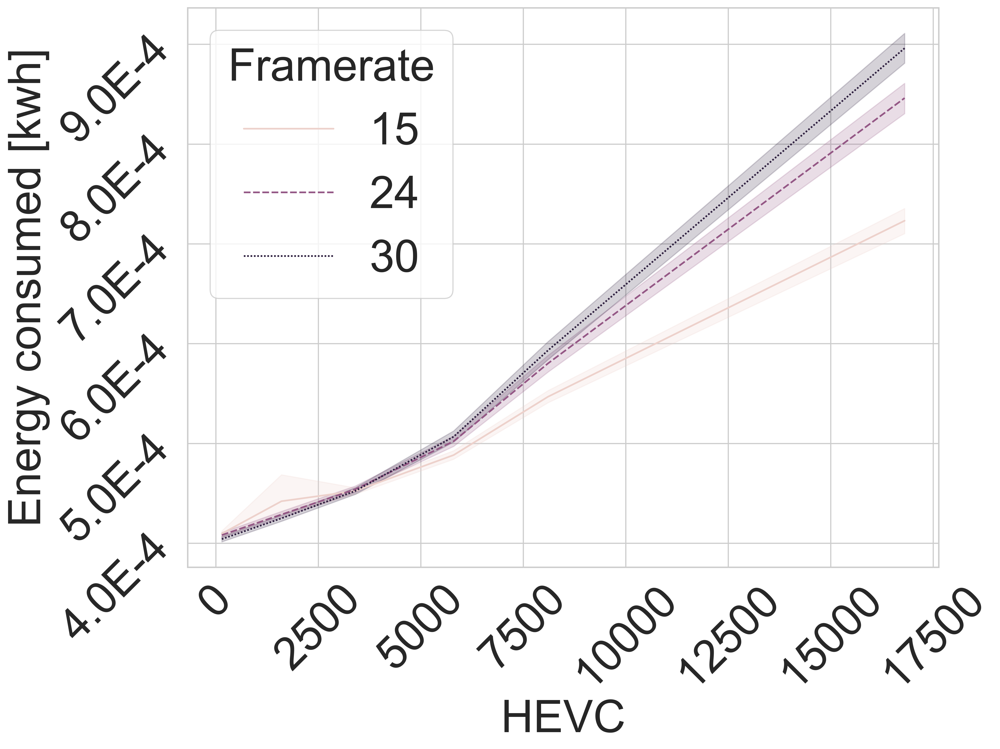

In [23]:
plt.figure(figsize=FIG_SIZE, dpi=DPI)
df_x_val = 'bitrate'
df_y_val = 'cpu_energy'
hue = 'fps'
line_plot = sns.lineplot(df_pd[df_pd['Codec'] == 'HEVC'], x=df_x_val, y=df_y_val, style=hue, hue=hue)
# line_plot = sns.boxplot(df_pd[df_pd['energy_consumed'] < df_pd['energy_consumed'].quantile(.99)], x=df_x_val, y=df_y_val, hue=hue)
line_plot.legend(fontsize=FONT_SIZE, title_fontsize=FONT_SIZE, title='Framerate')
line_plot.set_xlabel('HEVC', fontsize=FONT_SIZE)
line_plot.set_ylabel('Energy consumed [kwh]', fontsize=FONT_SIZE)
line_plot.set_xticklabels([x for x in line_plot.get_xticklabels()], size=FONT_SIZE, rotation=45)
line_plot.set_yticklabels(['{:.1E}'.format(Decimal(y)) for y in line_plot.get_yticks()], size=FONT_SIZE, rotation=45)
if include_title:
    plt.title('Average Memory Utilization per Bitrate')
plt.savefig(f'{figures_path}/avg_mem_per_br.pdf')

/var/folders/k8/rwvwc5ns3d16t55m5svq75wh0000gn/T/ipykernel_78459/4083118396.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  line_plot.set_xticklabels([x for x in line_plot.get_xticklabels()], size=FONT_SIZE, rotation=45)
/var/folders/k8/rwvwc5ns3d16t55m5svq75wh0000gn/T/ipykernel_78459/4083118396.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  line_plot.set_yticklabels(['{:.1E}'.format(Decimal(y)) for y in line_plot.get_yticks()], size=FONT_SIZE, rotation=45)


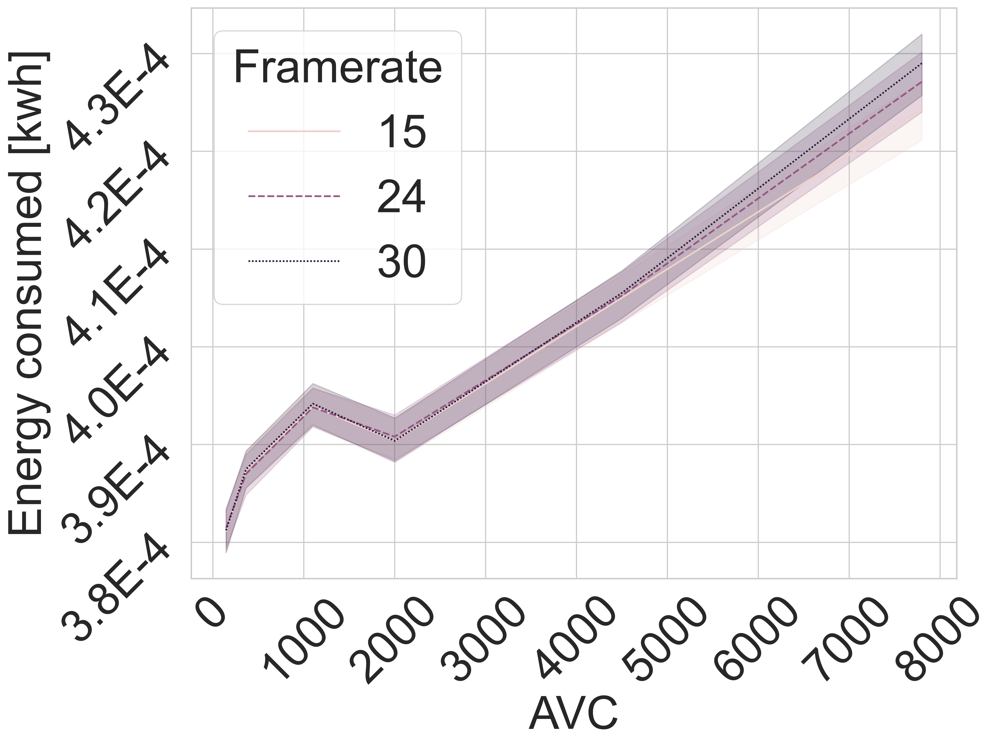

In [24]:
plt.figure(figsize=FIG_SIZE, dpi=DPI)
df_x_val = 'bitrate'
df_y_val = 'cpu_energy'
hue = 'fps'
line_plot = sns.lineplot(df_pd[df_pd['Codec'] == 'AVC'], x=df_x_val, y=df_y_val, style=hue, hue=hue)
# line_plot = sns.boxplot(df_pd[df_pd['energy_consumed'] < df_pd['energy_consumed'].quantile(.99)], x=df_x_val, y=df_y_val, hue=hue)
line_plot.legend(fontsize=FONT_SIZE, title_fontsize=FONT_SIZE, title='Framerate')
line_plot.set_xlabel('AVC', fontsize=FONT_SIZE)
line_plot.set_ylabel('Energy consumed [kwh]', fontsize=FONT_SIZE)
line_plot.set_xticklabels([x for x in line_plot.get_xticklabels()], size=FONT_SIZE, rotation=45)
line_plot.set_yticklabels(['{:.1E}'.format(Decimal(y)) for y in line_plot.get_yticks()], size=FONT_SIZE, rotation=45)
if include_title:
    plt.title('Average Memory Utilization per Bitrate')
plt.savefig(f'{figures_path}/avg_mem_per_br.pdf')